# **SME5924 - Processos Dinâmicos em Redes Complexas**


---


## **Questionário 4**

### Gabriela dos Santos Amaral

# **Introdução**

Notebook contendo os códigos desenvolvidos na linguagem *Python* para responder o questionário 4 da disciplina de Processos Dinâmicos em Redes Complexas (SME5924).

In [469]:
# !pip install python-louvain

In [470]:
# Bibliotecas

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import requests

import random
import math

from networkx.algorithms.community import greedy_modularity_communities
from community import community_louvain

# **Questão 1:** Calcule a modularidade para a rede Jazz usando método fastgreedy. Use:

```
G= nx.read_edgelist("data/jazz.txt", nodetype=int)
G = G.to_undirected()
G.remove_edges_from(nx.selfloop_edges(G))
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G = G.subgraph(Gcc[0])
G = nx.convert_node_labels_to_integers(G, first_label=0)
```

Primeiro, vamos ler os dados Jazz e visualizar o grafo:

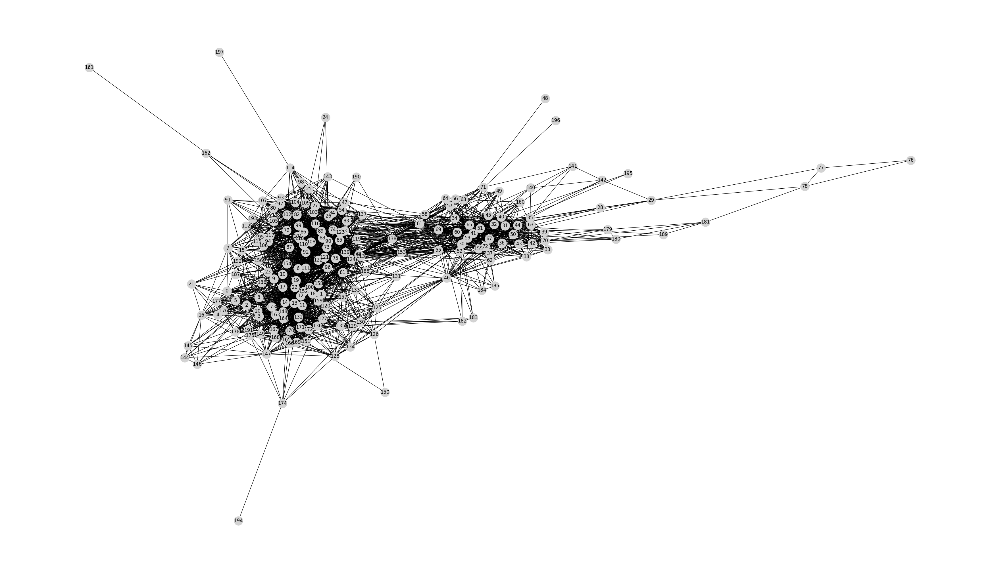

In [471]:
# Leitura da rede
network = 'jazz'
url = f'https://raw.githubusercontent.com/GabrielaSAmaral/ComplexNetworks/main/Dados/{network}.txt'

response = requests.get(url)
with open(f'{network}.txt', 'w') as file:
    file.write(response.text)

G = nx.read_edgelist(f'{network}.txt', nodetype=int)

# Transformando os labels para números inteiros, começando com 0
G = nx.convert_node_labels_to_integers(G, first_label=0)

# Para visualizar a rede
plt.figure(figsize=(35, 20))
pos = nx.spring_layout(G, seed = 11) # Definindo uma seed para sempre obter o mesmo gráfico (mesmas posições)
nx.draw(G, pos, node_color='lightgray', node_size=500, with_labels=True)

In [472]:
# Para tranformar a rede em sem direção. Porém, como a rede já é não direcionada, o código não é necessário.
G = G.to_undirected()
G.remove_edges_from(nx.selfloop_edges(G))

Vamos selecionar apenas o maior componente conectado:

In [473]:
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G = G.subgraph(Gcc[0])

# Outra forma
# Gcc = max(nx.connected_components(G), key=len)
# G = G.subgraph(Gcc).copy()

Podemos verificar o número de vértices (nodes) e arestas (edges):

In [474]:
N = len(G)
M = G.number_of_edges()
print('Número de nós (vértices):', N)
print('Número de arestas:', M)

Número de nós (vértices): 198
Número de arestas: 2742


Agora, vamos utilizar o método Fast-Greedy para identificar as comunidades:

In [475]:
communities = list(greedy_modularity_communities(G))
for k in range(0,len(communities)):
    print('Community',k,':', sorted(communities[k]))

Community 0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 100, 111, 120, 125, 126, 127, 128, 129, 130, 132, 134, 135, 136, 144, 145, 146, 147, 148, 149, 150, 151, 152, 157, 158, 159, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 191, 194]
Community 1 : [24, 25, 26, 27, 47, 53, 54, 73, 74, 75, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 112, 113, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 131, 133, 137, 139, 143, 154, 156, 161, 162, 190, 192, 193, 197]
Community 2 : [28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 76, 77, 78, 138, 140, 141, 142, 153, 155, 160, 179, 180, 181, 182, 183, 184, 185, 189, 195, 196]
Community 3 : [186, 187, 188]


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

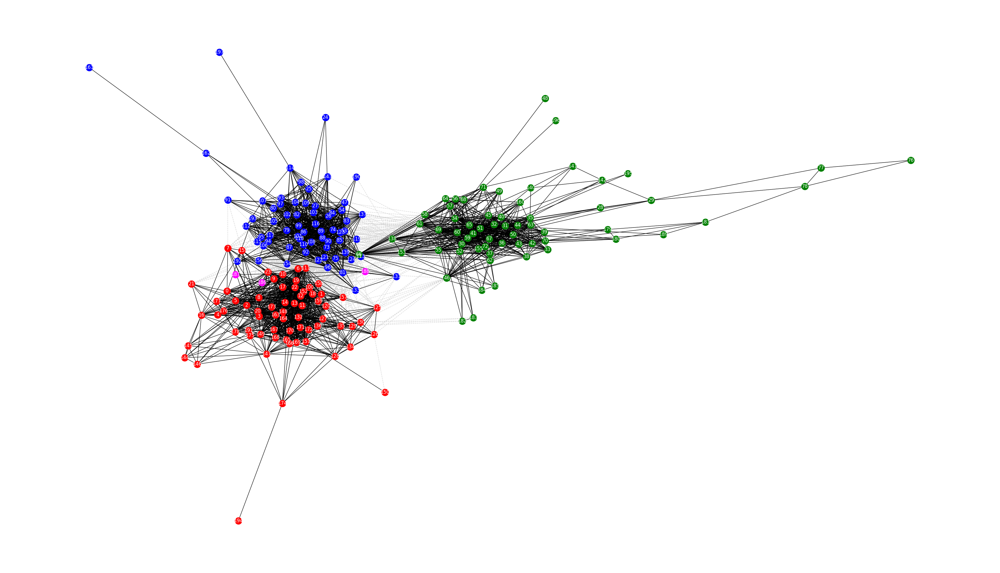

In [476]:
colors = ['red', 'blue', 'green', 'magenta', 'yellow']

fig= plt.figure(figsize=(35, 20))
nx.draw(G, pos=pos, node_color = 'white', edge_color='lightgray', style='dashed')
aux = 0
for cm in communities:
    nx.draw(G.subgraph(cm), pos=pos, node_color = colors[aux],
                     with_labels = True, node_size=300, font_color = 'white')
    aux = aux + 1
# plt.savefig('Jazz.eps') #save the figure into a file
plt.show(True)

Por fim, vamos calcular a medida de modularidade com a utilização do método Fast-Greedy:

In [477]:
def modularity(G, c):
    A = nx.adjacency_matrix(G)
    N = len(G)
    M = G.number_of_edges()
    Q = 0
    for i in np.arange(0,N):
        ki = len(list(G.neighbors(i)))
        for j in np.arange(0,N):
            if(c[i]==c[j]):
                kj = len(list(G.neighbors(j)))
                Q = Q + A[i,j]-(ki*kj)/(2*M)
    Q = Q/(2*M)
    return Q

In [478]:
c = list(greedy_modularity_communities(G))
communities = np.zeros(len(G.nodes()))
nc = 0
for k in range(0,len(c)):
    communities[sorted(c[k])]=nc
    nc = nc+1
    # print('Community:', sorted(c[k]))

In [479]:
print("Modularity Q = %.3f" % modularity(G,communities))

Modularity Q = 0.439


# **Questão 2:** Calcule a modularidade para a rede Jazz usando método Louvain. Use:

```
G= nx.read_edgelist("data/jazz.txt", nodetype=int)
G = G.to_undirected()
G.remove_edges_from(nx.selfloop_edges(G))
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G = G.subgraph(Gcc[0])
G = nx.convert_node_labels_to_integers(G, first_label=0)
```






Para este exercíco, usaremos a mesma rede da questão 1.

Vamos utilizar o método Louvain para identificar as comunidades:

In [480]:
partitions  = community_louvain.best_partition(G)
print(partitions)

{0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 1, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0, 21: 0, 22: 0, 23: 0, 24: 1, 25: 1, 26: 1, 27: 1, 28: 2, 29: 2, 30: 2, 31: 2, 32: 2, 33: 2, 34: 2, 35: 2, 36: 2, 37: 2, 38: 2, 39: 2, 40: 2, 41: 2, 42: 2, 43: 2, 44: 2, 45: 2, 46: 2, 47: 1, 48: 2, 49: 2, 50: 2, 51: 2, 52: 2, 53: 1, 54: 1, 55: 2, 56: 2, 57: 2, 58: 2, 59: 2, 60: 2, 61: 2, 62: 2, 63: 2, 64: 2, 65: 2, 66: 2, 67: 2, 68: 2, 69: 2, 70: 2, 71: 2, 72: 2, 73: 1, 74: 1, 75: 1, 76: 2, 77: 2, 78: 2, 79: 1, 80: 1, 81: 1, 82: 1, 83: 1, 84: 1, 85: 1, 86: 1, 87: 1, 88: 1, 89: 1, 90: 1, 91: 1, 92: 1, 93: 1, 94: 3, 95: 3, 96: 3, 97: 1, 98: 1, 99: 1, 100: 0, 101: 3, 102: 1, 103: 1, 104: 1, 105: 1, 106: 3, 107: 1, 108: 1, 109: 1, 110: 1, 111: 1, 112: 3, 113: 1, 114: 1, 115: 3, 116: 1, 117: 3, 118: 1, 119: 1, 120: 0, 121: 3, 122: 3, 123: 1, 124: 1, 125: 0, 126: 0, 127: 0, 128: 0, 129: 0, 130: 0, 131: 3, 132: 0, 133: 3, 134: 0, 135: 0, 136: 0, 137: 1, 138: 

Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

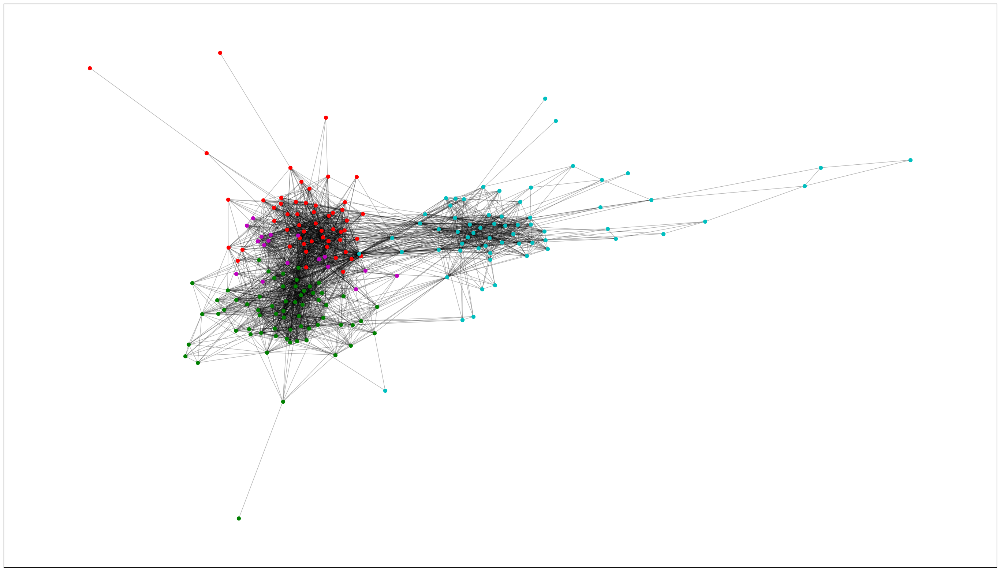

In [481]:
fig= plt.figure(figsize=(35, 20))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
size = float(len(set(partitions.values())))
count = 0
for com in set(partitions.values()) :
    count = count + 1.
    list_nodes = [nodes for nodes in partitions.keys() if partitions[nodes] == com]
    nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 50, node_color = colors[int(count)])
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.show()

Por fim, vamos calcular a medida de modularidade com a utilização do método Louvain:

In [482]:
modularity = community_louvain.modularity(partitions, G)

In [483]:
modularity = community_louvain.modularity(partitions, G)
print("Modularity Q = %.3f" % modularity)

Modularity Q = 0.444


# **Questão 3:** Considere o método de geração de redes LFR_benchmark_graph. Obtenha os valores da modularidade para $\mu=0.05$, $\mu=0.1$, $\mu=0.2$. Use o código a seguir para gerar as redes. Use o algoritmo de Louvain.

```
N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)
```






## $\mu$ = 0.05

Primeiramente, vamos gerar uma rede com o método LFR e $\mu$ = 0.05:

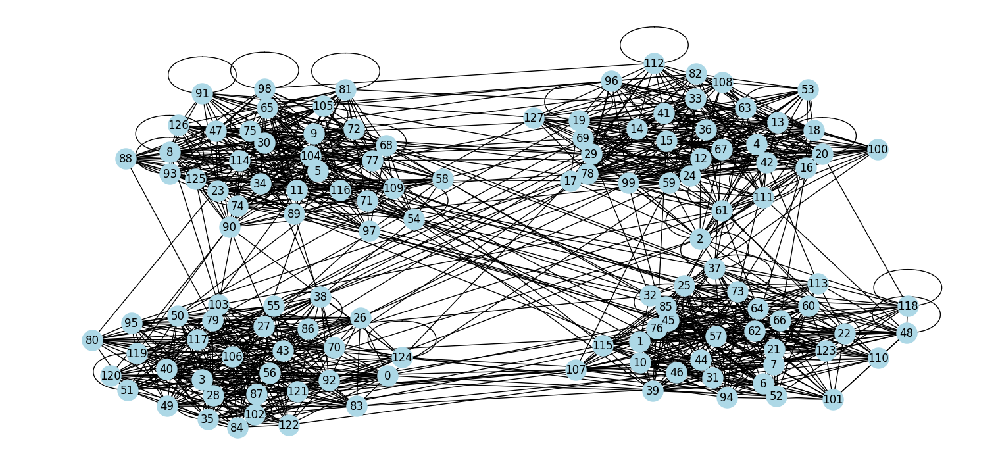

kin= 3.2


In [484]:
mu = 0.05

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Vamos utilizar o método Louvain para identificar as comunidades:

In [485]:
partitions  = community_louvain.best_partition(G)
print(partitions)

{0: 3, 1: 2, 2: 0, 3: 3, 4: 0, 5: 1, 6: 2, 7: 2, 8: 1, 9: 1, 10: 2, 11: 1, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0, 21: 2, 22: 2, 23: 1, 24: 0, 25: 2, 26: 3, 27: 3, 28: 3, 29: 0, 30: 1, 31: 2, 32: 2, 33: 0, 34: 1, 35: 3, 36: 0, 37: 2, 38: 3, 39: 2, 40: 3, 41: 0, 42: 0, 43: 3, 44: 2, 45: 2, 46: 2, 47: 1, 48: 2, 49: 3, 50: 3, 51: 3, 52: 2, 53: 0, 54: 1, 55: 3, 56: 3, 57: 2, 58: 1, 59: 0, 60: 2, 61: 0, 62: 2, 63: 0, 64: 2, 65: 1, 66: 2, 67: 0, 68: 1, 69: 0, 70: 3, 71: 1, 72: 1, 73: 2, 74: 1, 75: 1, 76: 2, 77: 1, 78: 0, 79: 3, 80: 3, 81: 1, 82: 0, 83: 3, 84: 3, 85: 2, 86: 3, 87: 3, 88: 1, 89: 1, 90: 1, 91: 1, 92: 3, 93: 1, 94: 2, 95: 3, 96: 0, 97: 1, 98: 1, 99: 0, 100: 0, 101: 2, 102: 3, 103: 3, 104: 1, 105: 1, 106: 3, 107: 2, 108: 0, 109: 1, 110: 2, 111: 0, 112: 0, 113: 2, 114: 1, 115: 2, 116: 1, 117: 3, 118: 2, 119: 3, 120: 3, 121: 3, 122: 3, 123: 2, 124: 3, 125: 1, 126: 1, 127: 0}


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

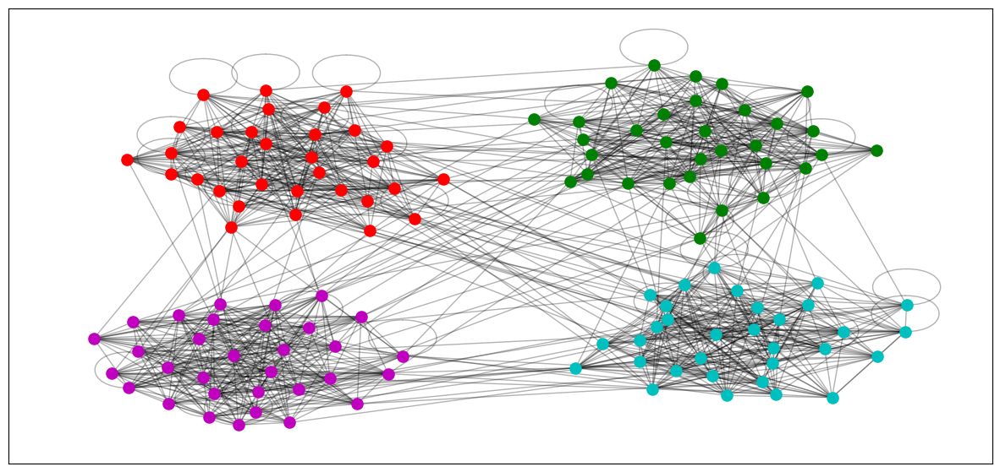

In [486]:
fig= plt.figure(figsize=(15, 7))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
size = float(len(set(partitions.values())))
count = 0
for com in set(partitions.values()) :
    count = count + 1.
    list_nodes = [nodes for nodes in partitions.keys() if partitions[nodes] == com]
    nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 90, node_color = colors[int(count)])
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.show()

Por fim, vamos calcular a medida de modularidade com a utilização do método Louvain:

In [487]:
modularity = community_louvain.modularity(partitions, G)
print("Modularity Q = %.3f" % modularity)

Modularity Q = 0.651


## $\mu$ = 0.1

Agora, vamos gerar uma rede com o método LFR e $\mu$ = 0.1:

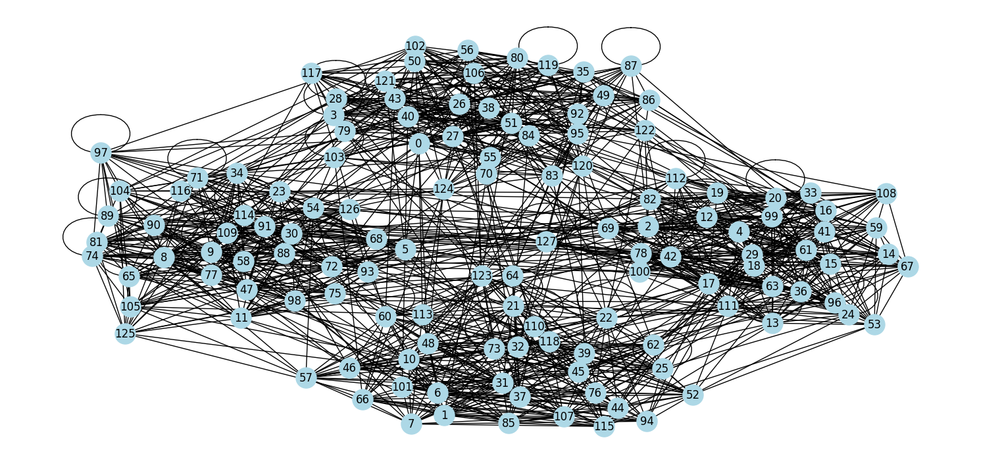

kin= 6.4


In [488]:
mu = 0.1

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Vamos utilizar o método Louvain para identificar as comunidades:

In [489]:
partitions  = community_louvain.best_partition(G)
print(partitions)

{0: 2, 1: 0, 2: 3, 3: 2, 4: 3, 5: 1, 6: 0, 7: 0, 8: 1, 9: 1, 10: 0, 11: 1, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3, 17: 3, 18: 3, 19: 3, 20: 3, 21: 0, 22: 0, 23: 1, 24: 3, 25: 0, 26: 2, 27: 2, 28: 2, 29: 3, 30: 1, 31: 0, 32: 0, 33: 3, 34: 1, 35: 2, 36: 3, 37: 0, 38: 2, 39: 0, 40: 2, 41: 3, 42: 3, 43: 2, 44: 0, 45: 0, 46: 0, 47: 1, 48: 0, 49: 2, 50: 2, 51: 2, 52: 0, 53: 3, 54: 1, 55: 2, 56: 2, 57: 0, 58: 1, 59: 3, 60: 0, 61: 3, 62: 0, 63: 3, 64: 0, 65: 1, 66: 0, 67: 3, 68: 1, 69: 3, 70: 2, 71: 1, 72: 1, 73: 0, 74: 1, 75: 1, 76: 0, 77: 1, 78: 3, 79: 2, 80: 2, 81: 1, 82: 3, 83: 2, 84: 2, 85: 0, 86: 2, 87: 2, 88: 1, 89: 1, 90: 1, 91: 1, 92: 2, 93: 1, 94: 0, 95: 2, 96: 3, 97: 1, 98: 1, 99: 3, 100: 3, 101: 0, 102: 2, 103: 2, 104: 1, 105: 1, 106: 2, 107: 0, 108: 3, 109: 1, 110: 0, 111: 3, 112: 3, 113: 0, 114: 1, 115: 0, 116: 1, 117: 2, 118: 0, 119: 2, 120: 2, 121: 2, 122: 2, 123: 0, 124: 2, 125: 1, 126: 1, 127: 3}


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

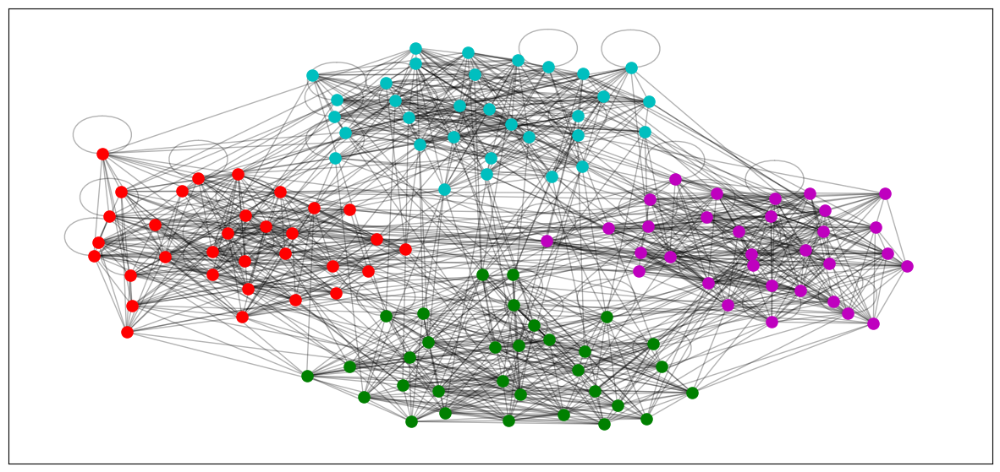

In [490]:
fig= plt.figure(figsize=(15, 7))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
size = float(len(set(partitions.values())))
count = 0
for com in set(partitions.values()) :
    count = count + 1.
    list_nodes = [nodes for nodes in partitions.keys() if partitions[nodes] == com]
    nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 90, node_color = colors[int(count)])
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.show()

Por fim, vamos calcular a medida de modularidade com a utilização do método Louvain:

In [491]:
modularity = community_louvain.modularity(partitions, G)
print("Modularity Q = %.3f" % modularity)

Modularity Q = 0.550


## $\mu$ = 0.2

Agora, vamos gerar uma rede com o método LFR e $\mu$ = 0.2:

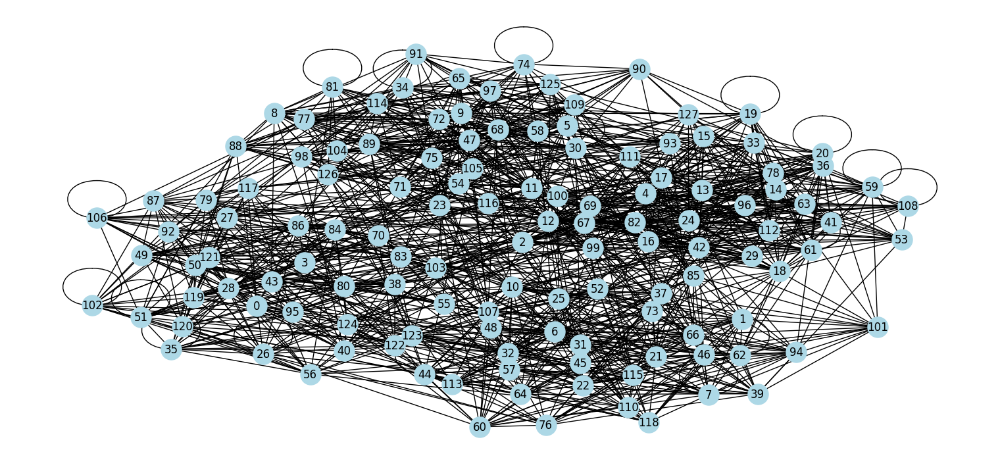

kin= 12.8


In [492]:
mu = 0.2

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Vamos utilizar o método Louvain para identificar as comunidades:

In [493]:
partitions  = community_louvain.best_partition(G)
print(partitions)

{0: 0, 1: 1, 2: 3, 3: 0, 4: 3, 5: 2, 6: 1, 7: 1, 8: 2, 9: 2, 10: 1, 11: 2, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3, 17: 3, 18: 3, 19: 3, 20: 3, 21: 1, 22: 1, 23: 2, 24: 3, 25: 1, 26: 0, 27: 0, 28: 0, 29: 3, 30: 2, 31: 1, 32: 1, 33: 3, 34: 2, 35: 0, 36: 3, 37: 1, 38: 0, 39: 1, 40: 0, 41: 3, 42: 3, 43: 0, 44: 1, 45: 1, 46: 1, 47: 2, 48: 1, 49: 0, 50: 0, 51: 0, 52: 1, 53: 3, 54: 2, 55: 0, 56: 0, 57: 1, 58: 2, 59: 3, 60: 1, 61: 3, 62: 1, 63: 3, 64: 1, 65: 2, 66: 1, 67: 3, 68: 2, 69: 3, 70: 0, 71: 2, 72: 2, 73: 1, 74: 2, 75: 2, 76: 1, 77: 2, 78: 3, 79: 0, 80: 0, 81: 2, 82: 3, 83: 0, 84: 0, 85: 1, 86: 0, 87: 0, 88: 2, 89: 2, 90: 2, 91: 2, 92: 0, 93: 2, 94: 1, 95: 0, 96: 3, 97: 2, 98: 2, 99: 3, 100: 3, 101: 1, 102: 0, 103: 0, 104: 2, 105: 2, 106: 0, 107: 1, 108: 3, 109: 2, 110: 1, 111: 3, 112: 3, 113: 1, 114: 2, 115: 1, 116: 2, 117: 0, 118: 1, 119: 0, 120: 0, 121: 0, 122: 0, 123: 1, 124: 0, 125: 2, 126: 2, 127: 3}


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

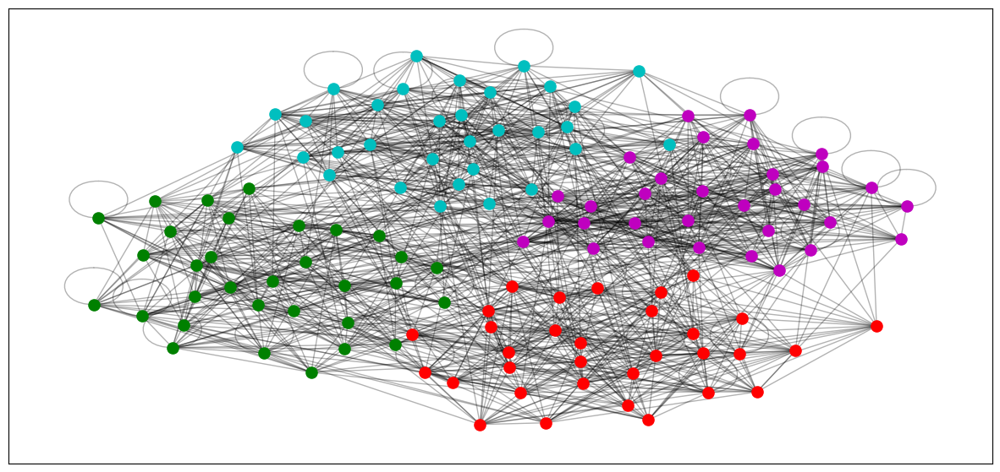

In [494]:
fig= plt.figure(figsize=(15, 7))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
size = float(len(set(partitions.values())))
count = 0
for com in set(partitions.values()) :
    count = count + 1.
    list_nodes = [nodes for nodes in partitions.keys() if partitions[nodes] == com]
    nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 90, node_color = colors[int(count)])
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.show()

Por fim, vamos calcular a medida de modularidade com a utilização do método Louvain:

In [495]:
modularity = community_louvain.modularity(partitions, G)
print("Modularity Q = %.3f" % modularity)

Modularity Q = 0.450


## Considerações finais

É possível perceber que conforme $\mu$ vai aumentando, as comunidades tendem a ser menos específicas, ou seja, não são tão diferenciáveis entre si. Ao aplicar o método de Louvain, obtemos as seguintes modularidades:

|$\mu$|Modularidade (Q)|
|----|----|
|0.05|0.651|
|0.1|0.550|
|0.2|0.450|

Podemos notar que conforme menor é $\mu$, mais modular é a rede. Portanto, quanto mais específica é uma rede, maior é sua modularidade, e assim, mais detectável são as comunidades.

# **Questão 3:** Considere o método de geração de redes LFR_benchmark_graph. Obtenha os valores da modularidade para $\mu=0.05$, $\mu=0.2$, $\mu=0.4$. Use o código a seguir para gerar as redes. Use o algoritmo fastgreedy.

```
N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)
```



## $\mu$ = 0.05

Primeiramente, vamos gerar uma rede com o método LFR e $\mu$ = 0.05:

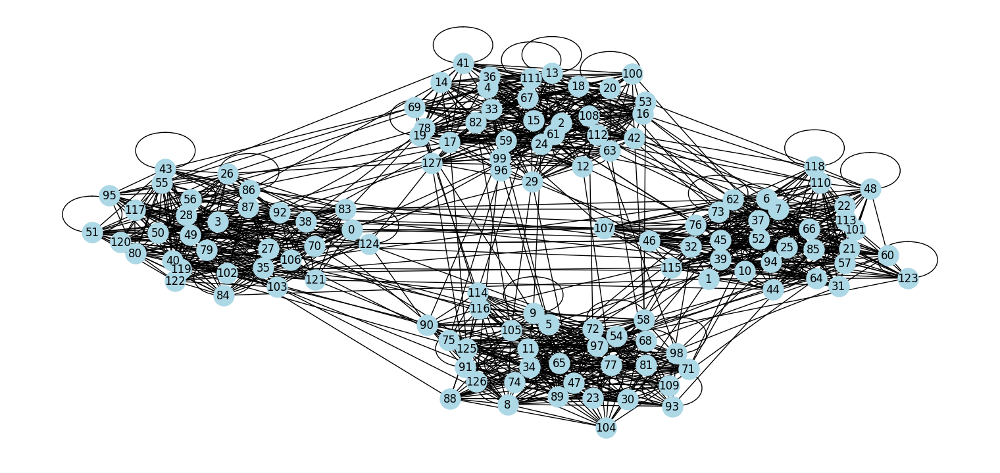

kin= 3.2


In [496]:
mu = 0.05

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Agora, vamos utilizar o método Fast-Greedy para identificar as comunidades:

In [497]:
communities = list(greedy_modularity_communities(G))
for k in range(0,len(communities)):
    print('Community',k,':', sorted(communities[k]))

Community 0 : [1, 6, 7, 10, 21, 22, 25, 31, 32, 37, 39, 44, 45, 46, 48, 52, 57, 60, 62, 64, 66, 73, 76, 85, 94, 101, 107, 110, 113, 115, 118, 123]
Community 1 : [0, 3, 26, 27, 28, 35, 38, 40, 43, 49, 50, 51, 55, 56, 70, 79, 80, 83, 84, 86, 87, 92, 95, 102, 103, 106, 117, 119, 120, 121, 122, 124]
Community 2 : [5, 8, 9, 11, 23, 30, 34, 47, 54, 58, 65, 68, 71, 72, 74, 75, 77, 81, 88, 89, 90, 91, 93, 97, 98, 104, 105, 109, 114, 116, 125, 126]
Community 3 : [2, 4, 12, 13, 14, 15, 16, 17, 18, 19, 20, 24, 29, 33, 36, 41, 42, 53, 59, 61, 63, 67, 69, 78, 82, 96, 99, 100, 108, 111, 112, 127]


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

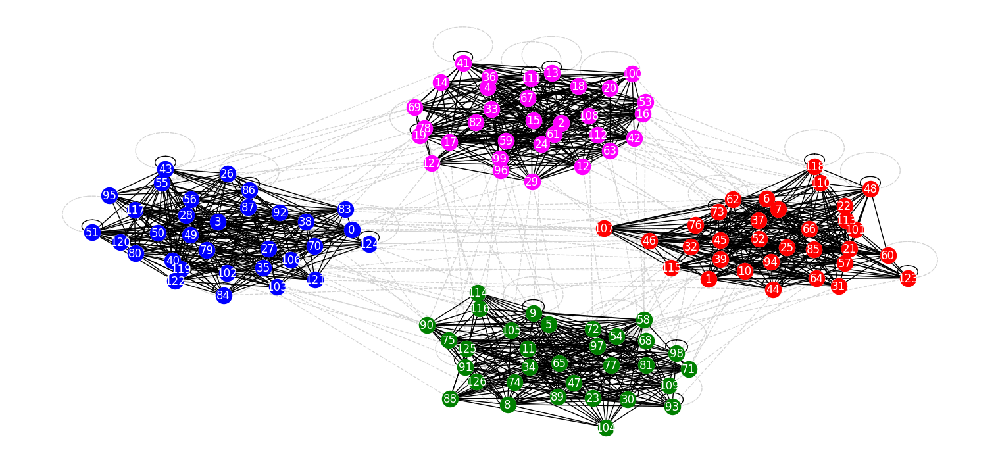

In [498]:
colors = ['red', 'blue', 'green', 'magenta', 'yellow']

fig= plt.figure(figsize=(15, 7))
nx.draw(G, pos=pos, node_color = 'white', edge_color='lightgray', style='dashed')
aux = 0
for cm in communities:
    nx.draw(G.subgraph(cm), pos=pos, node_color = colors[aux],
                     with_labels = True, node_size=300, font_color = 'white')
    aux = aux + 1
plt.show(True)

Por fim, vamos calcular a medida de modularidade com a utilização do método Fast-Greedy:

In [499]:
def modularity(G, c):
    A = nx.adjacency_matrix(G)
    N = len(G)
    M = G.number_of_edges()
    Q = 0
    for i in np.arange(0,N):
        ki = len(list(G.neighbors(i)))
        for j in np.arange(0,N):
            if(c[i]==c[j]):
                kj = len(list(G.neighbors(j)))
                Q = Q + A[i,j]-(ki*kj)/(2*M)
    Q = Q/(2*M)
    return Q

In [500]:
c = list(greedy_modularity_communities(G))
communities = np.zeros(len(G.nodes()))
nc = 0
for k in range(0,len(c)):
    communities[sorted(c[k])]=nc
    nc = nc+1
    # print('Community:', sorted(c[k]))

In [501]:
print("Modularity Q = %.3f" % modularity(G,communities))

Modularity Q = 0.644


## $\mu$ = 0.2

Primeiramente, vamos gerar uma rede com o método LFR e $\mu$ = 0.2:

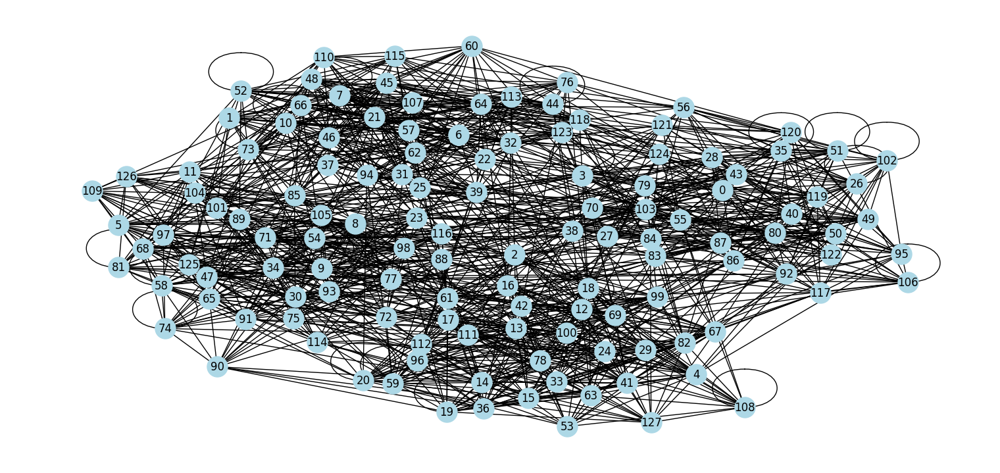

kin= 12.8


In [502]:
mu = 0.2

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Agora, vamos utilizar o método Fast-Greedy para identificar as comunidades:

In [503]:
communities = list(greedy_modularity_communities(G))
for k in range(0,len(communities)):
    print('Community',k,':', sorted(communities[k]))

Community 0 : [0, 3, 26, 27, 28, 35, 38, 40, 43, 49, 50, 51, 55, 56, 70, 79, 80, 83, 84, 86, 87, 92, 95, 102, 103, 106, 117, 119, 120, 121, 122, 123, 124]
Community 1 : [5, 8, 9, 11, 23, 30, 34, 47, 54, 58, 65, 68, 71, 72, 74, 75, 77, 81, 85, 88, 89, 90, 91, 93, 97, 98, 104, 105, 109, 114, 116, 125, 126]
Community 2 : [2, 4, 12, 13, 14, 15, 16, 17, 18, 19, 20, 24, 29, 33, 36, 41, 42, 53, 59, 61, 63, 67, 69, 78, 82, 96, 99, 100, 108, 111, 112, 127]
Community 3 : [1, 6, 7, 10, 21, 22, 25, 31, 32, 37, 39, 44, 45, 46, 48, 52, 57, 60, 62, 64, 66, 73, 76, 94, 101, 107, 110, 113, 115, 118]


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

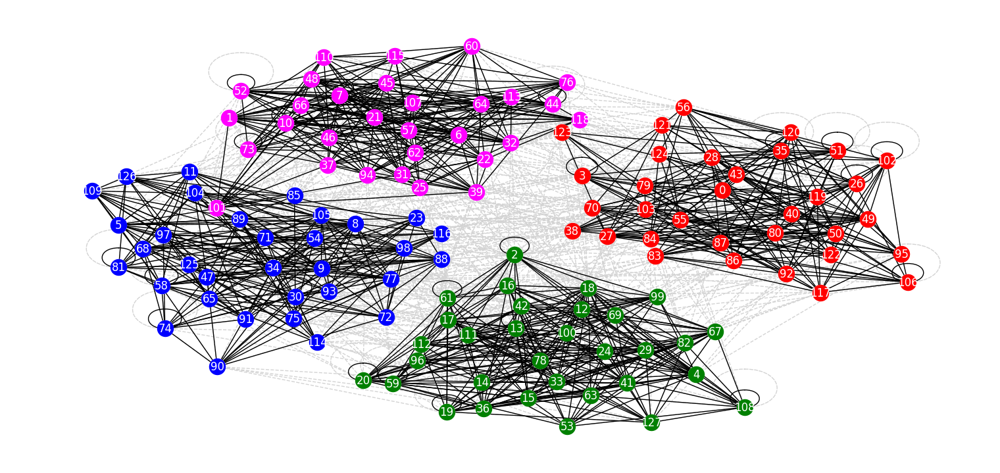

In [504]:
colors = ['red', 'blue', 'green', 'magenta', 'yellow']

fig= plt.figure(figsize=(15, 7))
nx.draw(G, pos=pos, node_color = 'white', edge_color='lightgray', style='dashed')
aux = 0
for cm in communities:
    nx.draw(G.subgraph(cm), pos=pos, node_color = colors[aux],
                     with_labels = True, node_size=300, font_color = 'white')
    aux = aux + 1
plt.show(True)

Por fim, vamos calcular a medida de modularidade com a utilização do método Fast-Greedy:

In [505]:
def modularity(G, c):
    A = nx.adjacency_matrix(G)
    N = len(G)
    M = G.number_of_edges()
    Q = 0
    for i in np.arange(0,N):
        ki = len(list(G.neighbors(i)))
        for j in np.arange(0,N):
            if(c[i]==c[j]):
                kj = len(list(G.neighbors(j)))
                Q = Q + A[i,j]-(ki*kj)/(2*M)
    Q = Q/(2*M)
    return Q

In [506]:
c = list(greedy_modularity_communities(G))
communities = np.zeros(len(G.nodes()))
nc = 0
for k in range(0,len(c)):
    communities[sorted(c[k])]=nc
    nc = nc+1
    # print('Community:', sorted(c[k]))

In [507]:
print("Modularity Q = %.3f" % modularity(G,communities))

Modularity Q = 0.435


## $\mu$ = 0.4

Primeiramente, vamos gerar uma rede com o método LFR e $\mu$ = 0.4:

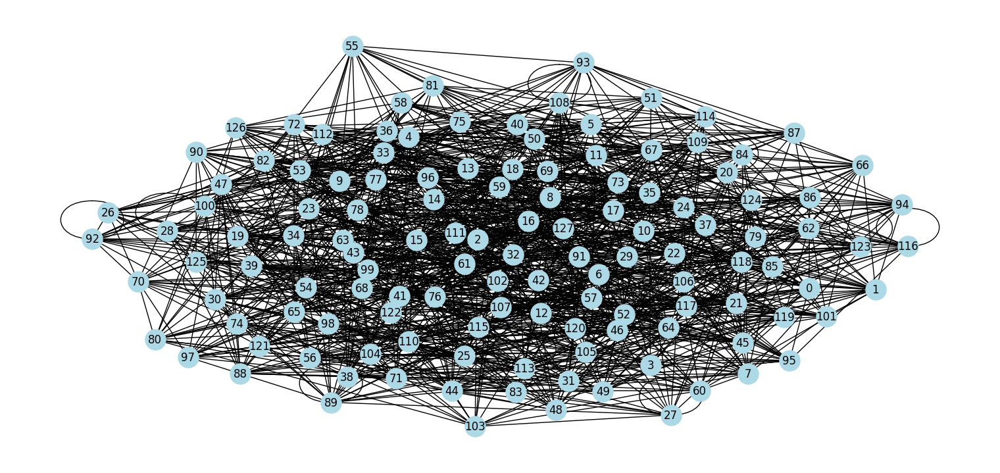

kin= 25.6


In [508]:
mu = 0.4

N = 128
tau1 = 3
tau2 = 1.5
k =16
minc = 32
maxc = 32

G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)

fig= plt.figure(figsize=(15, 7))

pos=nx.spring_layout(G)
nx.draw(G, pos=pos, node_color='lightblue', node_size=500, with_labels=True)
plt.show(True)
print('kin=', k*mu*4)

Agora, vamos utilizar o método Fast-Greedy para identificar as comunidades:

In [509]:
communities = list(greedy_modularity_communities(G))
for k in range(0,len(communities)):
    print('Community',k,':', sorted(communities[k]))

Community 0 : [0, 2, 8, 10, 13, 14, 15, 16, 17, 18, 20, 27, 29, 32, 33, 34, 35, 36, 41, 42, 44, 46, 48, 49, 53, 54, 56, 59, 61, 63, 64, 73, 79, 80, 82, 83, 86, 95, 96, 99, 103, 110, 111, 118, 120, 123]
Community 1 : [1, 4, 7, 9, 19, 21, 24, 31, 38, 39, 47, 51, 57, 65, 66, 69, 70, 71, 72, 74, 75, 88, 90, 91, 92, 93, 97, 98, 100, 101, 102, 106, 107, 108, 112, 114, 116, 117, 122, 125]
Community 2 : [3, 5, 6, 11, 23, 25, 26, 28, 37, 40, 45, 50, 52, 55, 58, 60, 67, 68, 76, 77, 81, 85, 89, 94, 104, 109, 115, 121, 124, 126]
Community 3 : [12, 22, 43, 62, 78, 105, 113, 119, 127]
Community 4 : [30, 84, 87]


Adicionalmente, podemos fazer um gráfico da rede com cada comunidade destacada:

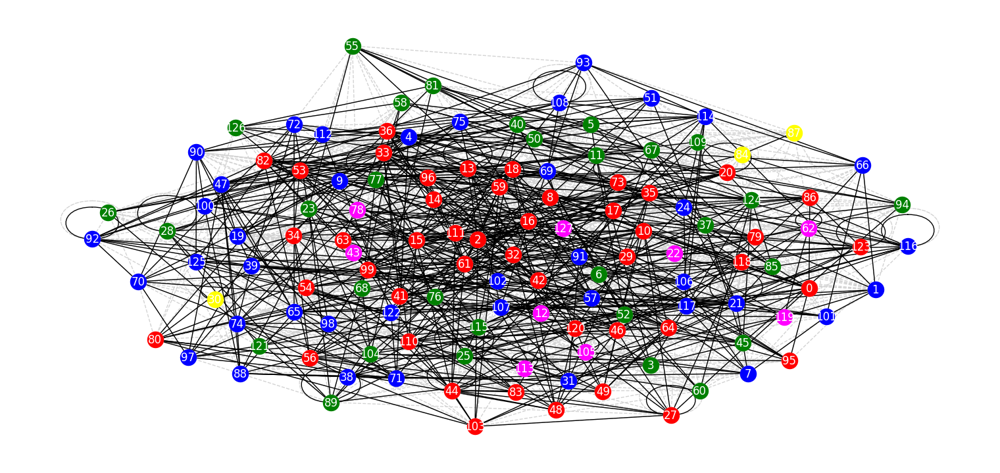

In [510]:
colors = ['red', 'blue', 'green', 'magenta', 'yellow']

fig= plt.figure(figsize=(15, 7))
nx.draw(G, pos=pos, node_color = 'white', edge_color='lightgray', style='dashed')
aux = 0
for cm in communities:
    nx.draw(G.subgraph(cm), pos=pos, node_color = colors[aux],
                     with_labels = True, node_size=300, font_color = 'white')
    aux = aux + 1
plt.show(True)

Por fim, vamos calcular a medida de modularidade com a utilização do método Fast-Greedy:

In [511]:
def modularity(G, c):
    A = nx.adjacency_matrix(G)
    N = len(G)
    M = G.number_of_edges()
    Q = 0
    for i in np.arange(0,N):
        ki = len(list(G.neighbors(i)))
        for j in np.arange(0,N):
            if(c[i]==c[j]):
                kj = len(list(G.neighbors(j)))
                Q = Q + A[i,j]-(ki*kj)/(2*M)
    Q = Q/(2*M)
    return Q

In [512]:
c = list(greedy_modularity_communities(G))
communities = np.zeros(len(G.nodes()))
nc = 0
for k in range(0,len(c)):
    communities[sorted(c[k])]=nc
    nc = nc+1
    # print('Community:', sorted(c[k]))

In [513]:
print("Modularity Q = %.3f" % modularity(G,communities))

Modularity Q = 0.160


## Considerações finais

Novamente, é possível perceber que conforme $\mu$ vai aumentando, as comunidades tendem a ser menos específicas, ou seja, não são tão diferenciáveis entre si. Ao aplicar o método de Fast-Greedy, obtemos as seguintes modularidades:

|$\mu$|Modularidade (Q)|
|----|----|
|0.05|0.644|
|0.2|0.435|
|0.4|0.160|

Podemos notar amis uma vez que conforme menor é $\mu$, mais modular é a rede. Portanto, quanto mais específica é uma rede, maior é sua modularidade, e assim, mais detectável são as comunidades.

In [514]:
# Código teste

# mu_list = [0.05, 0.1, 0.2]

# N = 128
# tau1 = 3
# tau2 = 1.5
# k =16
# minc = 32
# maxc = 32

# fig= plt.figure(figsize=(30,13))

# n = 1 # contador
# for mu in mu_list:

#   G = nx.LFR_benchmark_graph(n = N, tau1 = tau1, tau2 = tau2, mu = mu, min_degree = k, max_degree = k, min_community=minc, max_community = maxc, seed = 10)


#   plt.subplot(1, len(mu_list), n)
#   plt.title(rf"Rede Gerada com $\mu$ = {mu}")

#   colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
#   size = float(len(set(partitions.values())))
#   count = 0
#   for com in set(partitions.values()) :
#       count = count + 1.
#       list_nodes = [nodes for nodes in partitions.keys() if partitions[nodes] == com]
#       nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 90, node_color = colors[int(count)])

#   pos=nx.spring_layout(G)
#   nx.draw(G, pos=pos, node_size=100, with_labels = False, edge_color='gray', )
#   print(rf'k_in para mu = {mu}:', k*mu*4)

#   print(f"-------------------- RESULTADOS PARA REDE GERADA COM mu = {mu} --------------------")

#   partitions  = community_louvain.best_partition(G)
#   print("Partição:", partitions)
#   print("------------------------------------------------------------------------------------")

#   n += 1

# plt.show()